## 2.基于多个回归预测算法的房价预测 


In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import math
from scipy import stats
from scipy.stats import norm
import seaborn
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
%matplotlib inline

In [2]:
df_train = pd.read_csv('./data/data_train.csv',encoding='gbk')
df_train

,编号,建筑类,一般分区,街道连接距离,街区面积,道路类型,通道入口的类型,财产的类型,财产的平整度,实用工具,...,游泳池面积,泳池质量,栅栏的质量,杂项功能,杂特征值,销售月,销售年,销售类型,销售条件,房价
0,1,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
1,2,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
2,3,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
3,4,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
4,5,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1445,1446,90,RL,60.0,9000,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2009,WD,Normal,136000
1446,1447,20,RL,78.0,9262,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2009,New,Partial,287090
1447,1448,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2006,WD,Normal,145000
1448,1449,20,RL,90.0,17217,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,WD,Abnorml,84500


In [3]:
print(df_train.columns)

Index(['编号', '建筑类', '一般分区', '街道连接距离', '街区面积', '道路类型', '通道入口的类型', '财产的类型',
       '财产的平整度', '实用工具', '很多配置', '坡的财产', '街区', '邻近的道路或铁路1', '邻近的道路或铁路2',
       '住宅类型', '住宅风格', '材料和质量', '总体状况评价', '原施工日期', '重塑日期', '屋顶类型', '屋面材料',
       '第一外部材料', '第二外部材料', '砌体饰面型', '砌体饰面面积', '外部材料质量', '外部材料条件', '基金会的类型',
       '地下室的高度', '地下室的条件', '花园层地下室墙', '地下室基底质量', '地下室基底面积', '地下室第二成品区质量',
       '地下室第二成品区面积', '未使用的地下室面积', '地下室总面积', '加热类型', '加热质量', '中央空调', '电气系统',
       '一楼面积', '二楼面积', '各楼层低质量面积', '居住面积', '地下室全浴室', '地下室半浴室', '全浴室', '半浴室',
       '卧室数', '厨房数量', '厨房的品质', '房间总数', '家庭功能评级', '壁炉', '壁炉质量', '车库类型',
       '车库修筑年份', '车库室内装修', '车库车位数量', '车库规模', '车库质量', '车库条件', '车道', '木甲板面积',
       '开放式阳台的面积', '封闭式阳台的面积', '三季阳台的面积', '纱窗门廊区', '游泳池面积', '泳池质量', '栅栏的质量',
       '杂项功能', '杂特征值', '销售月', '销售年', '销售类型', '销售条件', '房价'],
      dtype='object')


count      1450.000000
mean     180827.807586
std       79630.148742
min       34900.000000
25%      129900.000000
50%      162950.000000
75%      214000.000000
max      755000.000000
Name: 房价, dtype: float64

Skewness: 1.884788
Kurtosis: 6.519471


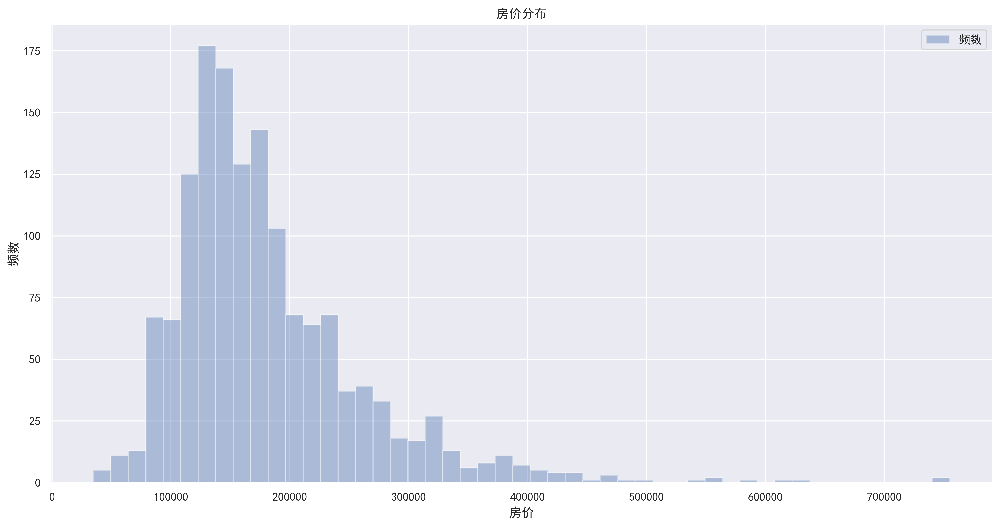

In [4]:
print(df_train['房价'].describe())
print("\nSkewness: %f" % df_train['房价'].skew())
print("Kurtosis: %f" % df_train['房价'].kurt())
myfont=FontProperties(fname=r'C:\Windows\Fonts\simhei.ttf')
seaborn.set(font=myfont.get_name())
plt.figure(figsize=(16, 8),dpi=600)
plt.ylabel('频数')
plt.title('房价分布')
seaborn.distplot(df_train['房价'],kde=False,hist_kws={"label":"频数"})
plt.legend()

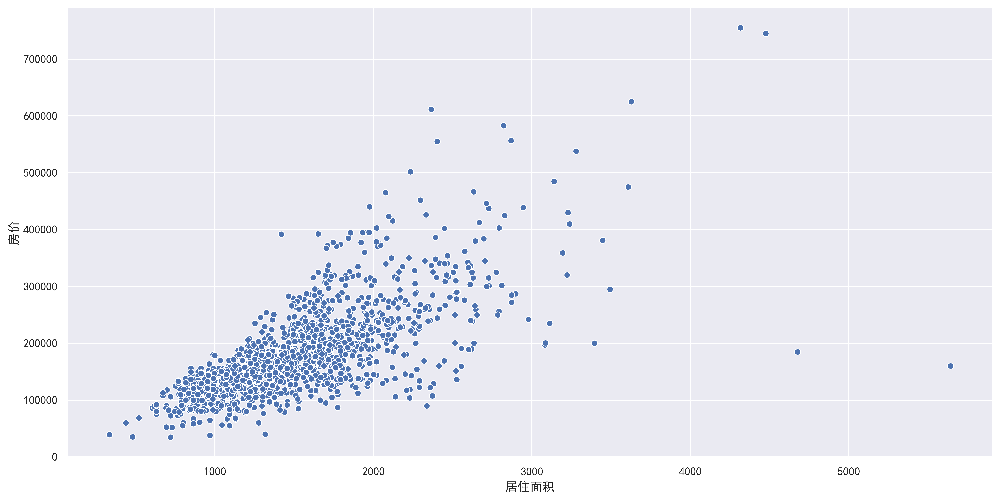

In [5]:
data = pd.concat([df_train['房价'], df_train['居住面积']], axis=1)
plt.figure(figsize=(16, 8),dpi=600)
seaborn.scatterplot(data['居住面积'],data['房价'])

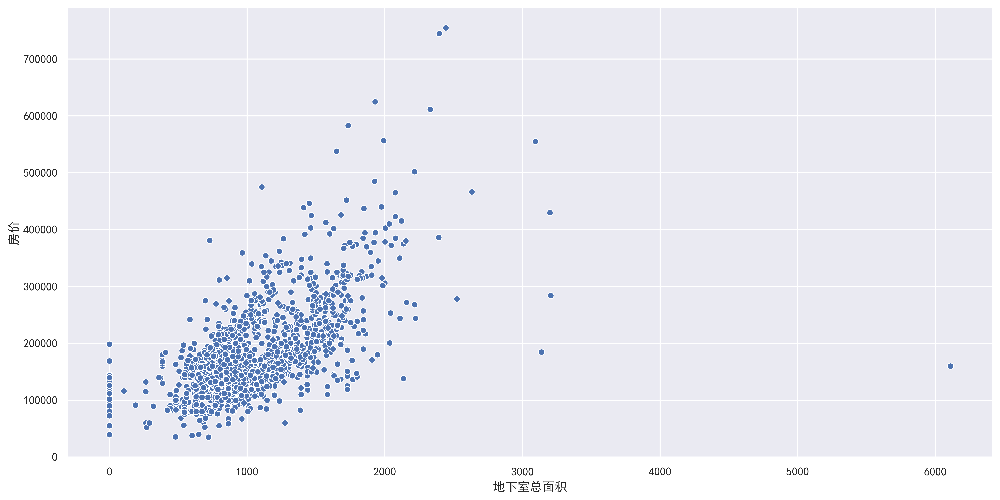

In [6]:
data = pd.concat([df_train['房价'], df_train['地下室总面积']], axis=1)
plt.figure(figsize=(16, 8),dpi=600)
seaborn.scatterplot(data['地下室总面积'],data['房价'])

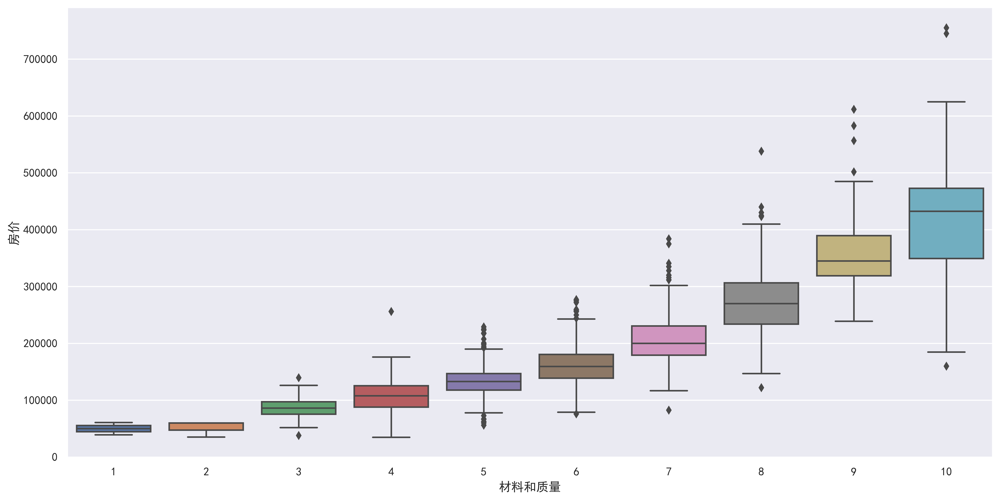

In [7]:
data = pd.concat([df_train['房价'], df_train['材料和质量']], axis=1)
plt.figure(figsize=(16, 8),dpi=600)
seaborn.boxplot(data=data,x='材料和质量', y="房价")

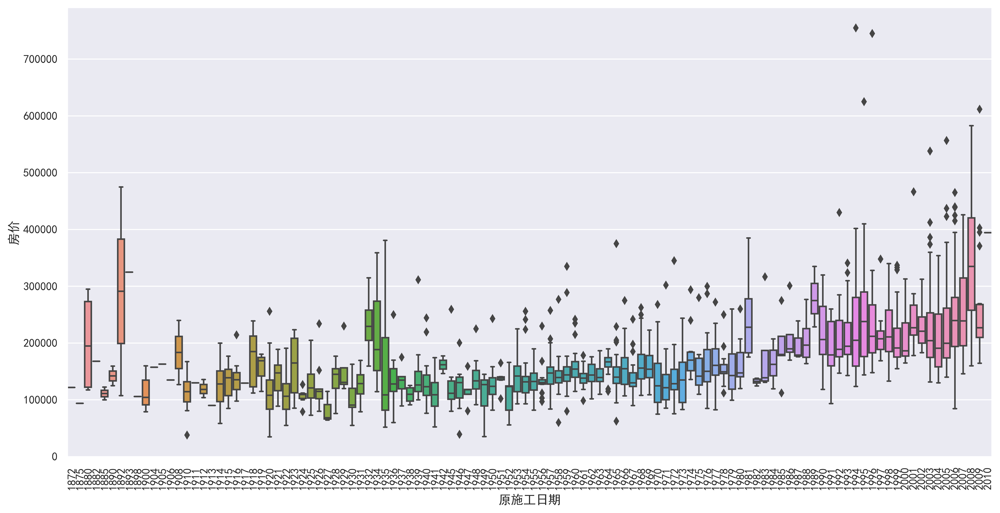

In [8]:
data = pd.concat([df_train['房价'], df_train['原施工日期']], axis=1)
plt.figure(figsize=(16, 8),dpi=600)
plt.xticks(rotation=90)
seaborn.boxplot(data=data,x='原施工日期', y="房价")

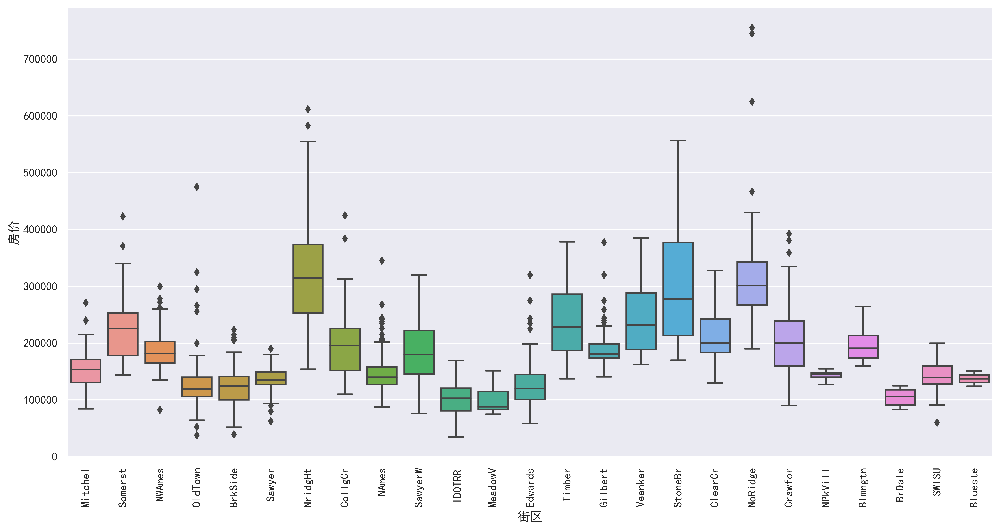

In [9]:
data = pd.concat([df_train['房价'], df_train['街区']], axis=1)
plt.figure(figsize=(16, 8),dpi=600)
plt.xticks(rotation=90)
seaborn.boxplot(data=data,x='街区', y="房价" )

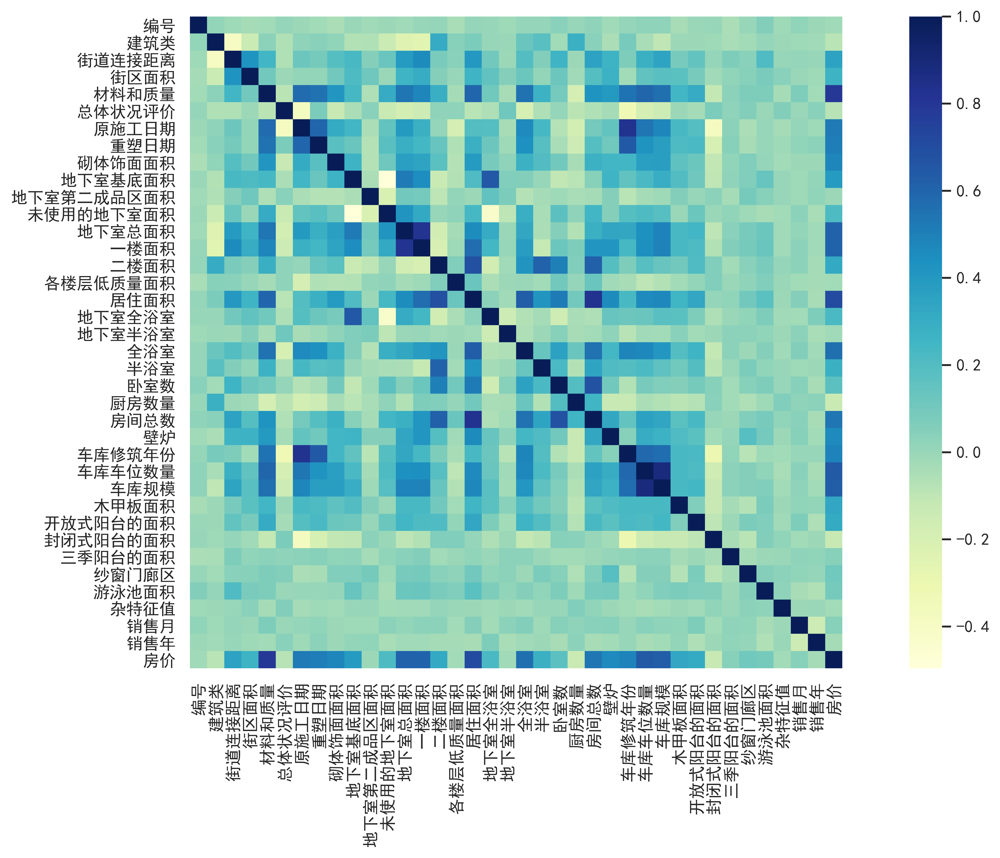

In [10]:
corrmat = df_train.corr()
plt.figure(figsize=(16, 8),dpi=600)
plt.rcParams['axes.unicode_minus'] = False
seaborn.heatmap(corrmat,square=True,cmap='YlGnBu',xticklabels=True,yticklabels=True)

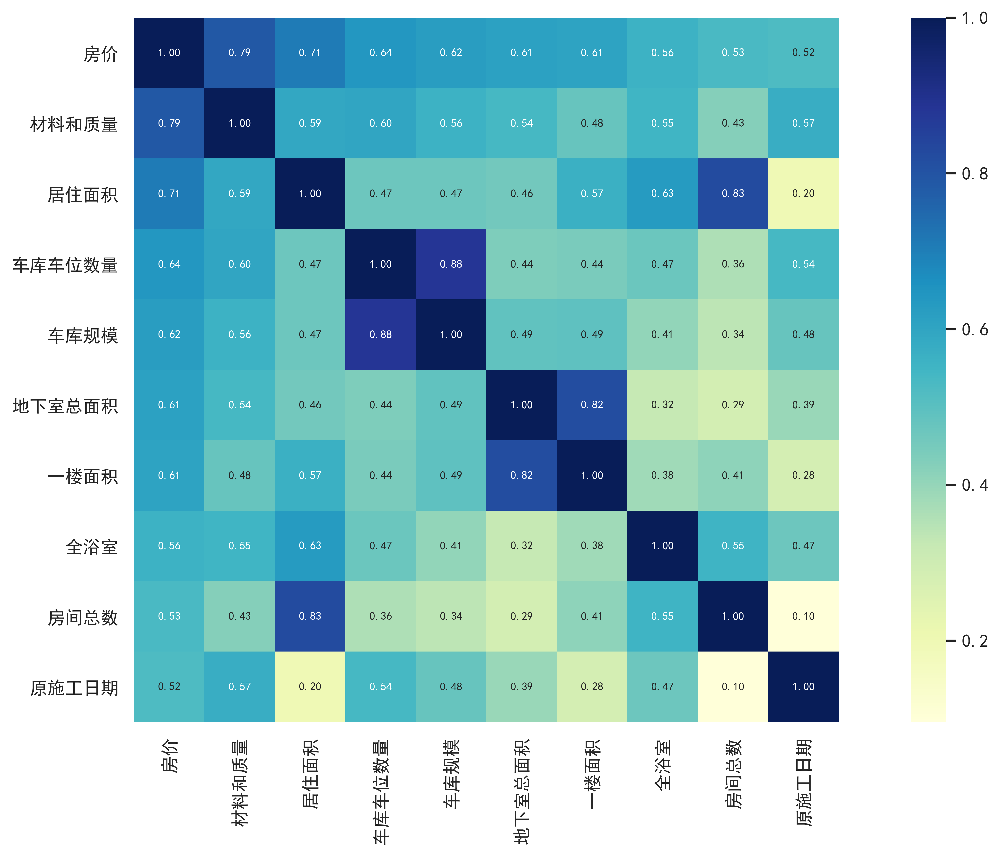

In [11]:
k = 10
cols = corrmat.nlargest(k, '房价')['房价'].index
cm = np.corrcoef(df_train[cols].values.T)

plt.figure(figsize=(16, 8),dpi=600)
hm = seaborn.heatmap(cm, annot=True, square=True, fmt='.2f', annot_kws={'size': 7}, 
                 yticklabels=cols.values, xticklabels=cols.values,cmap='YlGnBu')

In [12]:
total_isnull = df_train.isnull().sum().sort_values(ascending=False)
total_isnull

泳池质量       1443
杂项功能       1397
通道入口的类型    1359
栅栏的质量      1171
壁炉质量        687
           ... 
中央空调          0
销售条件          0
加热类型          0
地下室总面积        0
编号            0
Length: 81, dtype: int64

In [13]:
total_number_rows=len(df_train)
percent = (total_isnull/total_number_rows)*100

missing_data = pd.concat([total_isnull, percent], axis=1, keys=['缺失值数量', '百分比'])
missing_data.head(20)

,缺失值数量,百分比
泳池质量,1443,99.517241
杂项功能,1397,96.344828
通道入口的类型,1359,93.724138
栅栏的质量,1171,80.758621
壁炉质量,687,47.379310
街道连接距离,259,17.862069
车库条件,81,5.586207
车库类型,81,5.586207
车库修筑年份,81,5.586207
车库室内装修,81,5.586207


In [14]:
train = pd.read_csv('./data/data_train.csv',encoding='gbk')
test = pd.read_csv('./data/data_test.csv',encoding='gbk')

print("The train data size before dropping Id feature is : （%d %d）" %(train.shape[0],test.shape[1]))
print("The test data size before dropping Id feature is : （%d %d）\n" %(test.shape[0],test.shape[1]))

train.drop("编号", axis = 1, inplace = True)
test.drop("编号", axis = 1, inplace = True)

print("The train data size after dropping Id feature is : （%d %d）" %(train.shape[0],test.shape[1]))
print("The train data size after dropping Id feature is : （%d %d）" %(test.shape[0],test.shape[1]))

The train data size before dropping Id feature is : （1450 80）
The test data size before dropping Id feature is : （1449 80）

The train data size after dropping Id feature is : （1450 79）
The train data size after dropping Id feature is : （1449 79）


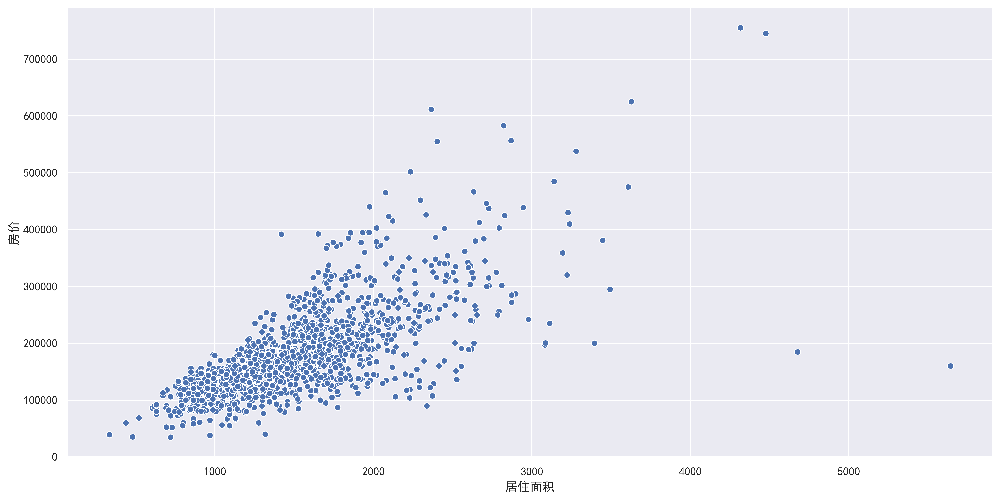

In [15]:
plt.figure(figsize=(16, 8),dpi=600)
fig = seaborn.scatterplot(train['居住面积'],train['房价'])

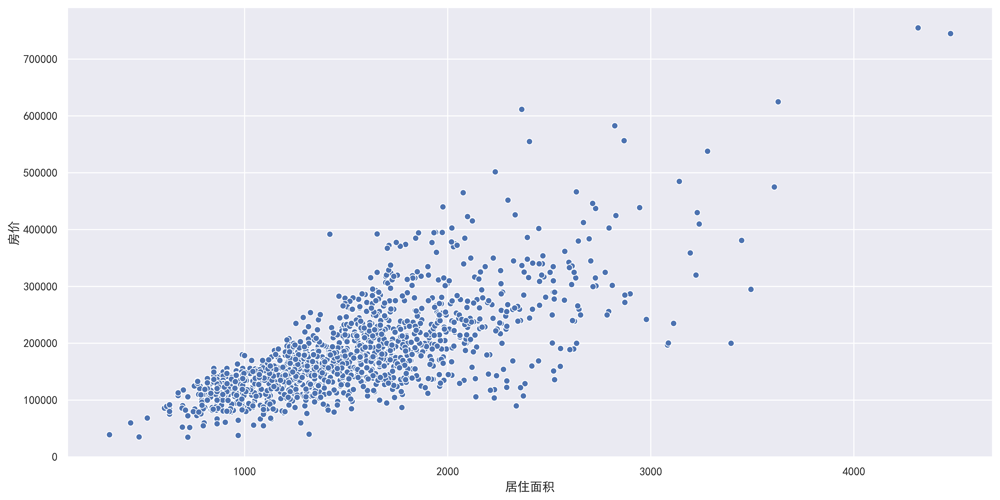

In [16]:
train = train.drop(train[(train['居住面积']>4000) & (train['房价']<300000)].index)

plt.figure(figsize=(16, 8),dpi=600)
fig = seaborn.scatterplot(train['居住面积'],train['房价'])


 mu = 180839.48 and sigma = 79655.69



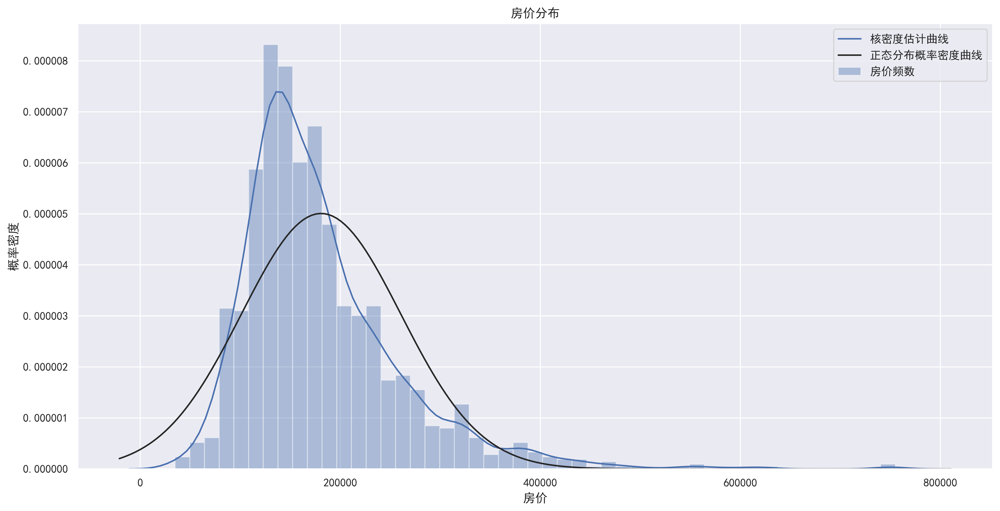

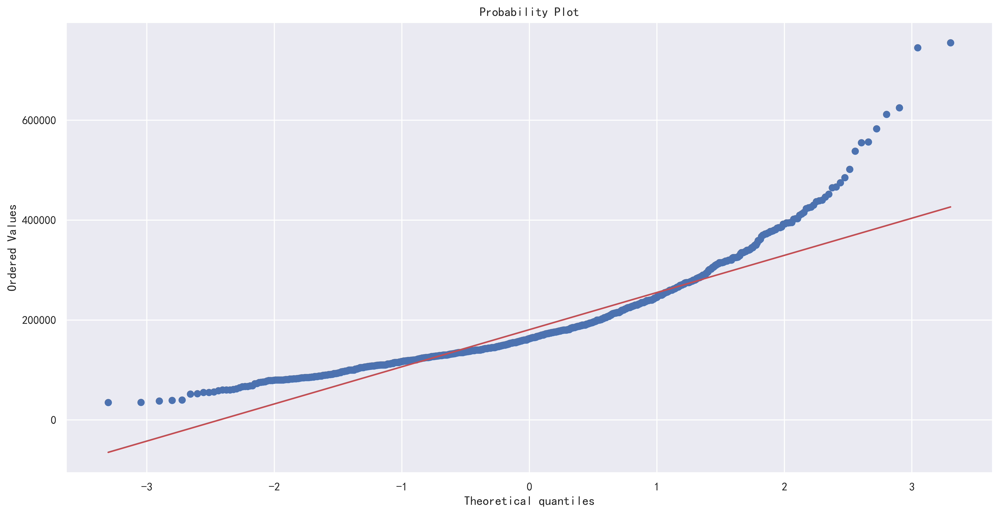

In [17]:
(mu, sigma) = norm.fit(train['房价'])
print("\n mu = %.2f and sigma = %.2f\n" %(mu,sigma))

plt.figure(figsize=(16, 8),dpi=600)
plt.ylabel('概率密度')
plt.title('房价分布')
seaborn.distplot(train['房价'] ,fit=norm,kde=True,fit_kws={"label":"正态分布概率密度曲线"},
                 kde_kws={"label":"核密度估计曲线"},hist_kws={"label":"房价频数"})
plt.legend()

plt.figure(figsize=(16, 8),dpi=600)#
res = stats.probplot(train['房价'], plot=plt)


 mu = 12.02 and sigma = 0.40



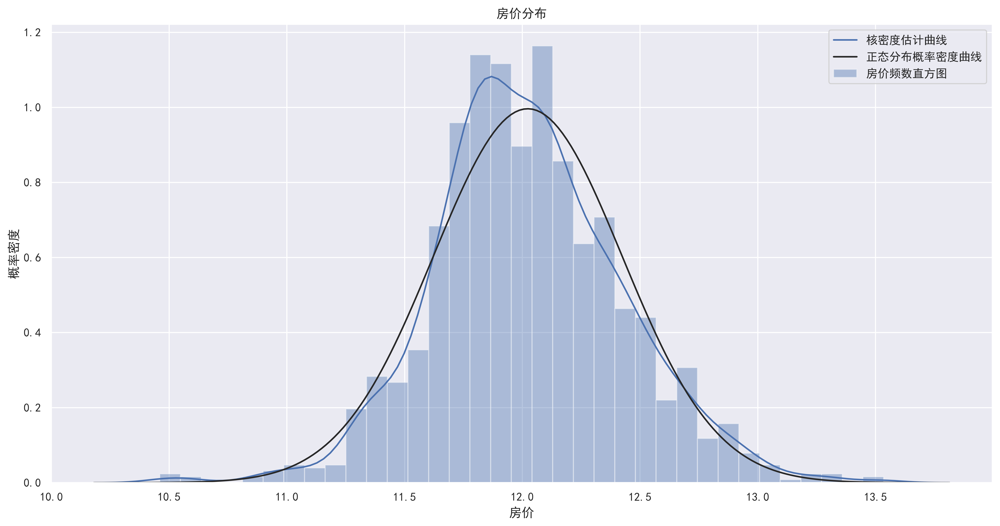

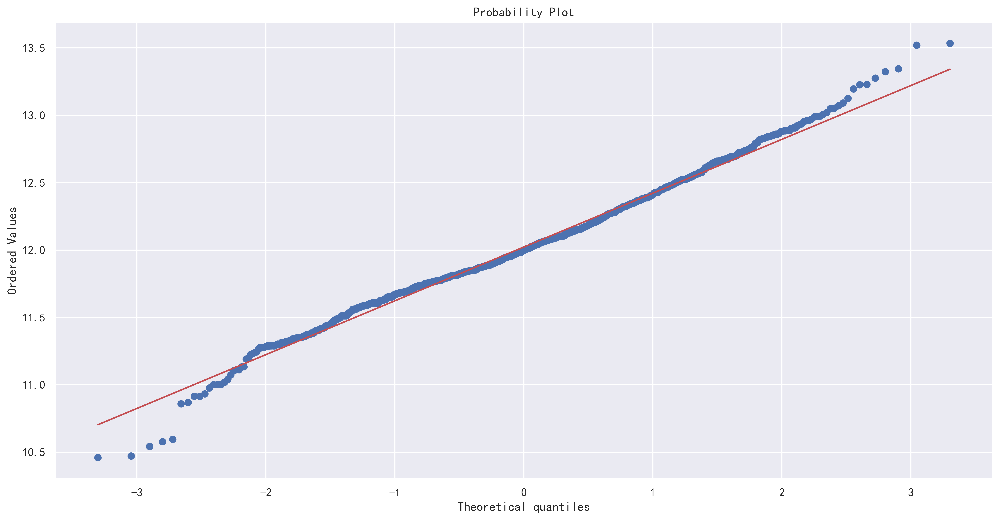

In [18]:
train["房价"] = np.log1p(train["房价"])

(mu, sigma) = norm.fit(train['房价'])
print("\n mu = %.2f and sigma = %.2f\n" %(mu,sigma))

plt.figure(figsize=(16, 8),dpi=600)
plt.ylabel('概率密度')
plt.title('房价分布')
seaborn.distplot(train['房价'] ,fit=norm,kde=True,fit_kws={"label":"正态分布概率密度曲线"},
                 kde_kws={"label":"核密度估计曲线"},hist_kws={"label":"房价频数直方图"})
plt.legend()


plt.figure(figsize=(16, 8),dpi=600)
res = stats.probplot(train['房价'], plot=plt)

In [19]:
ntrain = train.shape[0]
y_train = train.房价.values
all_data = pd.concat((train, test)).reset_index(drop=True)
all_data.drop(['房价'], axis=1, inplace=True)
print("all_data size is :(%d,%d) " %(all_data.shape[0],all_data.shape[1]))

all_data size is :(2897,79) 


In [20]:
all_data_na = (all_data.isnull().sum() / len(all_data)) * 100
all_data_na

建筑类        0.000000
一般分区       0.138074
街道连接距离    16.775975
街区面积       0.000000
道路类型       0.000000
            ...    
杂特征值       0.000000
销售月        0.000000
销售年        0.000000
销售类型       0.034518
销售条件       0.000000
Length: 79, dtype: float64

In [21]:
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)[:10]
missing_data = pd.DataFrame({'缺失值占比' :all_data_na})
missing_data

,缺失值占比
泳池质量,99.689334
杂项功能,96.479116
通道入口的类型,93.165343
栅栏的质量,80.462547
壁炉质量,48.705557
街道连接距离,16.775975
车库室内装修,5.419399
车库修筑年份,5.419399
车库质量,5.419399
车库条件,5.419399


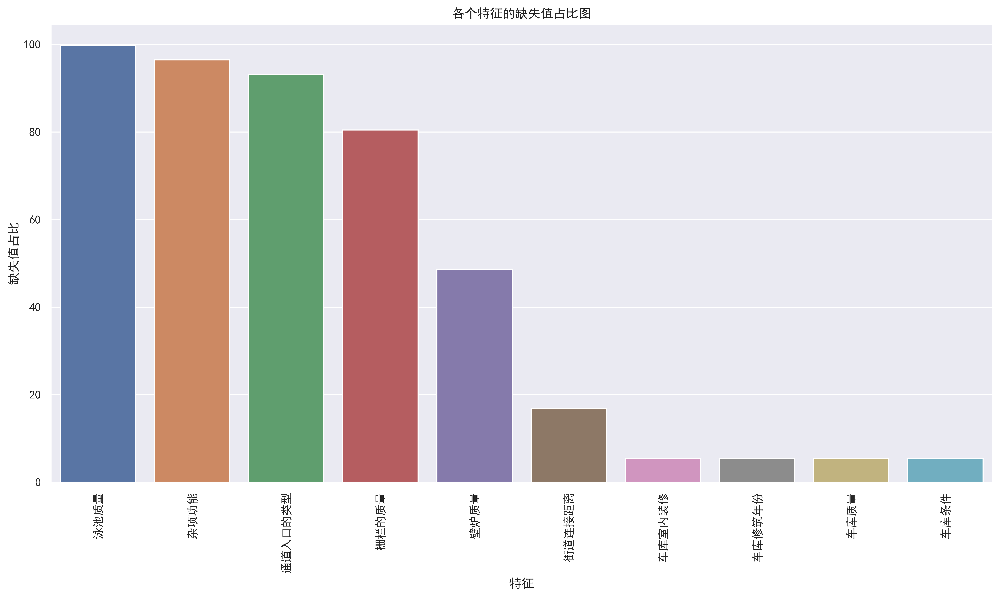

In [22]:
plt.figure(figsize=(16, 8),dpi=600)
plt.xticks(rotation='90')
plt.xlabel('特征')
plt.ylabel('缺失值占比')
plt.title('各个特征的缺失值占比图')
seaborn.barplot(x=all_data_na.index, y=all_data_na)

In [23]:
cols = ('泳池质量','车库类型', '车库室内装修', '车库质量', '车库条件','地下室的高度','地下室的条件','花园层地下室墙',
        '地下室基底质量','地下室第二成品区质量','砌体饰面型','砌体饰面型','杂项功能','通道入口的类型',
        '栅栏的质量','壁炉质量','建筑类','实用工具')                      

for col in cols:
    all_data[col] = all_data[col].fillna('None')
    
all_data['泳池质量']

0       None
1       None
2       None
3       None
4       None
        ... 
2892    None
2893    None
2894    None
2895    None
2896    None
Name: 泳池质量, Length: 2897, dtype: object

In [24]:
list(all_data.groupby('街区')['街道连接距离'])[0:3]

[('Blmngtn',
  214     43.0
  224     43.0
  380     43.0
  438     53.0
  460      NaN
  553      NaN
  591     53.0
  633     53.0
  784     43.0
  845      NaN
  976     43.0
  998     43.0
  1013    43.0
  1017    43.0
  1120    53.0
  1387    53.0
  1408    51.0
  1466    43.0
  1668    43.0
  1967     NaN
  1968     NaN
  1969    53.0
  2303     NaN
  2304    53.0
  2654    43.0
  2655     NaN
  2656     NaN
  2657    43.0
  Name: 街道连接距离, dtype: float64),
 ('Blueste',
  593     24.0
  950     24.0
  1581    35.0
  1582    35.0
  1890    24.0
  1891    24.0
  1892    24.0
  2192    24.0
  2552    24.0
  2554    35.0
  Name: 街道连接距离, dtype: float64),
 ('BrDale',
  220     21.0
  222     21.0
  227     21.0
  230     21.0
  358     21.0
  425     21.0
  427     24.0
  495     21.0
  649     21.0
  831     21.0
  1023    21.0
  1098    24.0
  1213    21.0
  1285    21.0
  1327    24.0
  1371    21.0
  1454    21.0
  1455    21.0
  1634    21.0
  1635    21.0
  1944    21.0
  1945    2

In [25]:
all_data['街道连接距离'] = all_data.groupby('街区')['街道连接距离'].transform(lambda x: x.fillna(x.median()))
all_data['街道连接距离']

0       85.0
1       75.0
2       80.0
3       51.0
4       50.0
        ... 
2892    21.0
2893    21.0
2894    80.0
2895    21.0
2896    21.0
Name: 街道连接距离, Length: 2897, dtype: float64

In [26]:
cols = ('车库修筑年份','车库规模','车库车位数量','地下室基底面积','地下室第二成品区面积',
        '未使用的地下室面积','地下室总面积','地下室全浴室','地下室半浴室','砌体饰面面积','砌体饰面面积')                     
for col in cols:
    all_data[col] = all_data[col].fillna(0)
    
all_data['车库规模']

0       480.0
1       636.0
2       484.0
3       468.0
4       205.0
        ...  
2892      0.0
2893    253.0
2894    336.0
2895    286.0
2896      0.0
Name: 车库规模, Length: 2897, dtype: float64

In [27]:
cols = ('一般分区','电气系统','厨房的品质','第一外部材料','第二外部材料','家庭功能评级','销售类型')                    
for col in cols:
    all_data[col] = all_data[col].fillna(all_data[col].mode()[0]) 
all_data['厨房的品质']

0       TA
1       Gd
2       TA
3       TA
4       TA
        ..
2892    TA
2893    TA
2894    TA
2895    TA
2896    TA
Name: 厨房的品质, Length: 2897, dtype: object

In [28]:
all_data_na = (all_data.isnull().sum() / len(all_data)) * 100
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)
missing_data = pd.DataFrame({' 缺失值占比' :all_data_na})
missing_data.head()

,缺失值占比


In [29]:
c='壁炉质量'
all_data_c_list=list(all_data[c].values)
all_data_c_list_df=pd.DataFrame(all_data_c_list,columns=['beforeTransform'])

from sklearn.preprocessing import LabelEncoder                 
myLabel = LabelEncoder()                                 
myLabel.fit(all_data_c_list)                            
all_data_c_list_transform= myLabel.transform(all_data_c_list)
all_data_c_list_transform_df=pd.DataFrame(all_data_c_list_transform,columns=['afterTransform'])

pd.concat([all_data_c_list_df,all_data_c_list_transform_df],axis=1).head(15)

,beforeTransform,afterTransform
0,None,3
1,Gd,2
2,TA,5
3,TA,5
4,TA,5
5,None,3
6,Gd,2
7,None,3
8,Gd,2
9,Fa,1


In [30]:
print(all_data['建筑类'])

all_data['建筑类'] = all_data['建筑类'].apply(str)
all_data['总体状况评价'] = all_data['总体状况评价'].apply(str)
all_data['销售年'] = all_data['销售年'].apply(str)
all_data['销售月'] = all_data['销售月'].apply(str)

0        50
1        20
2        60
3        50
4       190
       ... 
2892    180
2893    160
2894     20
2895    160
2896    160
Name: 建筑类, Length: 2897, dtype: int64


In [32]:
from sklearn.preprocessing import LabelEncoder
cols = ('壁炉质量', '地下室的高度', '地下室的条件', '车库质量', '车库条件', 
        '外部材料质量', '外部材料条件','加热质量', '泳池质量', '厨房的品质', '地下室基底质量', 
        '地下室第二成品区质量', '家庭功能评级', '栅栏的质量', '花园层地下室墙', '车库室内装修', '坡的财产',
        '财产的类型', '车道', '道路类型', '通道入口的类型', '中央空调', '建筑类', '总体状况评价', 
        '销售年', '销售月')                      

for c in cols:
    myLabel = LabelEncoder()
    myLabel.fit(list(all_data[c].values))
    all_data[c] = myLabel.transform(list(all_data[c].values))
        
print('Shape all_data: (%d,%d)'%(all_data.shape[0],all_data.shape[1]))    

Shape all_data: (2897,79)


In [33]:
all_data['总面积'] = all_data['地下室总面积'] + all_data['一楼面积'] + all_data['二楼面积']

In [34]:
all_data.dtypes

建筑类         int64
一般分区       object
街道连接距离    float64
街区面积        int64
道路类型        int64
           ...   
销售月         int64
销售年         int64
销售类型       object
销售条件       object
总面积       float64
Length: 80, dtype: object

In [35]:
from scipy.stats import norm, skew
numeric_feats = all_data.dtypes[all_data.dtypes != "object"].index
skewed_feats = all_data[numeric_feats].apply(lambda x: skew(x)).sort_values(ascending=False)
print("\n所有数值型特征的偏度为: \n")
skewness = pd.DataFrame({'偏度值' :skewed_feats})
skewness.head(10)


所有数值型特征的偏度为: 



,偏度值
杂特征值,24.221986
游泳池面积,17.627341
街区面积,13.100769
各楼层低质量面积,12.042235
三季阳台的面积,11.332155
坡的财产,4.976369
厨房数量,4.283471
地下室第二成品区面积,4.146882
封闭式阳台的面积,4.006466
纱窗门廊区,3.944876


In [36]:
skewness = skewness[abs(skewness) > 0.75]
print("总共有 %d 个特征需要进行BOX-COX变换" %skewness.shape[0])
from scipy.special import boxcox1p
skewed_features = skewness.index
lam = 0.15 
for feat in skewed_features:
    all_data[feat] = boxcox1p(all_data[feat], lam)

总共有 59 个特征需要进行BOX-COX变换


In [37]:
sale_contion=all_data['销售条件']
sale_contion

0        Normal
1        Normal
2        Normal
3       Abnorml
4        Normal
         ...   
2892     Normal
2893     Normal
2894     Normal
2895    Abnorml
2896     Normal
Name: 销售条件, Length: 2897, dtype: object

In [38]:
sale_contion_afterDummies=pd.get_dummies(sale_contion)
sale_contion_afterDummies

,Abnorml,AdjLand,Alloca,Family,Normal,Partial
0,0,0,0,0,1,0
1,0,0,0,0,1,0
2,0,0,0,0,1,0
3,1,0,0,0,0,0
4,0,0,0,0,1,0
...,...,...,...,...,...,...
2892,0,0,0,0,1,0
2893,0,0,0,0,1,0
2894,0,0,0,0,1,0
2895,1,0,0,0,0,0


In [39]:
all_data = pd.get_dummies(all_data)
print(all_data.shape)
all_data

(2897, 223)


,建筑类,街道连接距离,街区面积,道路类型,通道入口的类型,财产的类型,坡的财产,材料和质量,总体状况评价,原施工日期,...,销售类型_ConLw,销售类型_New,销售类型_Oth,销售类型_WD,销售条件_Abnorml,销售条件_AdjLand,销售条件_Alloca,销售条件_Family,销售条件_Normal,销售条件_Partial
0,2.750250,6.337529,21.282283,0.730463,0.730463,0.000000,0.000000,2.055642,1.820334,14.171884,...,0,0,0,1,0,0,0,0,1,0
1,2.055642,6.098626,19.907529,0.730463,0.730463,1.540963,0.000000,2.602594,1.820334,14.189087,...,0,0,0,1,0,0,0,0,1,0
2,2.885846,6.221214,20.023862,0.730463,0.730463,0.000000,0.000000,2.440268,2.055642,14.140398,...,0,0,0,1,0,0,0,0,1,0
3,2.750250,5.392276,17.989871,0.730463,0.730463,1.540963,0.000000,2.440268,1.820334,14.073384,...,0,0,0,1,1,0,0,0,0,0
4,1.820334,5.357203,18.712544,0.730463,0.730463,1.540963,0.000000,2.055642,2.055642,14.086243,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2892,1.540963,3.932510,13.242388,0.730463,0.730463,1.540963,0.000000,1.820334,2.055642,14.135652,...,0,0,0,1,0,0,0,0,1,0
2893,1.194318,3.932510,13.270696,0.730463,0.730463,1.540963,0.000000,1.820334,1.540963,14.138816,...,0,0,0,1,0,0,0,0,1,0
2894,2.055642,6.221214,21.060245,0.730463,0.730463,1.540963,0.730463,2.055642,1.820334,14.134068,...,0,0,0,1,0,0,0,0,1,0
2895,1.194318,3.932510,13.368020,0.730463,0.730463,1.540963,0.000000,1.820334,1.820334,14.135652,...,0,0,0,1,1,0,0,0,0,0


In [40]:
train = all_data[:ntrain]
test = all_data[ntrain:]

In [41]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import ElasticNet, Lasso
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score,train_test_split

In [42]:
Lasso = Lasso(alpha =0.0005, random_state=0)

KRR = KernelRidge(alpha=0.6, kernel='polynomial', degree=2)

ENet = ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=0)

GBR = GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt', random_state =0)

XGBR = xgb.XGBRegressor(n_estimators=2200,learning_rate=0.05, max_depth=3, 
                        reg_alpha=0.4640, reg_lambda=0.8571)


In [43]:
class AveragingModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, models):
        self.models = models
        
    def fit(self, X, y):
        self.models_ = [clone(x) for x in self.models]
        for model in self.models_:
            model.fit(X, y)
        return self

    def predict(self, X):
        predictions = np.column_stack([
            model.predict(X) for model in self.models_
        ])
        return np.mean(predictions, axis=1)   

In [52]:
class StackingAveragedModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, base_models, meta_model, n_folds=5):
        self.base_models = base_models
        self.meta_model = meta_model
        self.n_folds = n_folds
    def fit(self, X, y):
        self.base_models_ = [list() for x in self.base_models]
        self.meta_model_ = clone(self.meta_model)
        
        kfold = KFold(n_splits=self.n_folds, shuffle=True, random_state=0)
        out_of_fold_predictions = np.zeros((X.shape[0], len(self.base_models)))
        for i, model in enumerate(self.base_models):
            for train_index, holdout_index in kfold.split(X, y):
                instance = clone(model)
                self.base_models_[i].append(instance)
                instance.fit(X[train_index], y[train_index])
                y_pred = instance.predict(X[holdout_index])
                out_of_fold_predictions[holdout_index, i] = y_pred     
        self.meta_model_.fit(out_of_fold_predictions, y)
        return self
    def predict(self, X):
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_ ])
        return self.meta_model_.predict(meta_features)

In [53]:
n_folds = 5
def rmse_cv(model):
    kf = KFold(n_folds, shuffle=True, random_state=0).get_n_splits(train.values)
    rmse= np.sqrt(-cross_val_score(model, train.values, y_train, scoring="neg_mean_squared_error", cv = kf))
    return(rmse)

In [54]:
score = rmse_cv(Lasso)
print("\nLasso score: %.4f (%.4f)\n" %(score.mean(),score.std()))


Lasso score: 0.1137 (0.0077)



In [55]:
score = rmse_cv(ENet)
print("ElasticNet score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

ElasticNet score:  0.1136 (0.0077)



In [56]:
score = rmse_cv(KRR)
print("Kernel Ridge score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

Kernel Ridge score:  0.1168 (0.0073)



In [57]:
score = rmse_cv(GBR)
print("Gradient Boosting score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

Gradient Boosting score:  0.1152 (0.0074)



In [58]:
score = rmse_cv(XGBR)
print("Xgboost score: %.4f (%.4f)\n" %(score.mean(),score.std()))

Xgboost score: 0.1198 (0.0067)



In [59]:
averaged_models = AveragingModels(models = (ENet, GBR, KRR, Lasso))

score = rmse_cv(averaged_models)
print(" Averaged base models score: %.4f (%.4f)\n" %(score.mean(),score.std()))

 Averaged base models score: 0.1097 (0.0078)



In [60]:
stacked_averaged_models1 = StackingAveragedModels(base_models = (ENet, GBR, KRR),
                                                 meta_model = Lasso)

score = rmse_cv(stacked_averaged_models1)
print("Stacking Averaged models1 score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

Stacking Averaged models1 score:  0.1087 (0.0071)



In [61]:
stacked_averaged_models2 = StackingAveragedModels(base_models = (Lasso, GBR, KRR),
                                                 meta_model = ENet)
 
score = rmse_cv(stacked_averaged_models2)
print("Stacking Averaged models2 score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

Stacking Averaged models2 score:  0.1087 (0.0070)



In [62]:
stacked_averaged_models3 = StackingAveragedModels(base_models = (ENet, Lasso, KRR),
                                                 meta_model = GBR)

score = rmse_cv(stacked_averaged_models3)#计算均方根误差
print("Stacking Averaged models3 score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

Stacking Averaged models3 score:  0.1303 (0.0134)



In [63]:
stacked_averaged_models4 = StackingAveragedModels(base_models = (ENet, GBR, Lasso),
                                                 meta_model = KRR)

score = rmse_cv(stacked_averaged_models4)
print("Stacking Averaged models4 score:  %.4f (%.4f)\n" %(score.mean(),score.std()))

Stacking Averaged models4 score:  0.1087 (0.0071)



**5.模型应用**

In [64]:
stacked_averaged_models4.fit(np.array(train),y_train)
y_pred=stacked_averaged_models4.predict(test)

In [65]:
y_pred_real=[]
for i in range(len(y_pred)):
    y_pred_real_i=pow(math.exp(1),y_pred[i])-1
    y_pred_real.append(y_pred_real_i)

In [66]:
pd.DataFrame(y_pred_real).describe()

,0
count,1449.000000
mean,178733.215023
std,78228.579183
min,43633.012482
25%,126618.438971
50%,157570.749056
75%,210838.939138
max,735893.715900


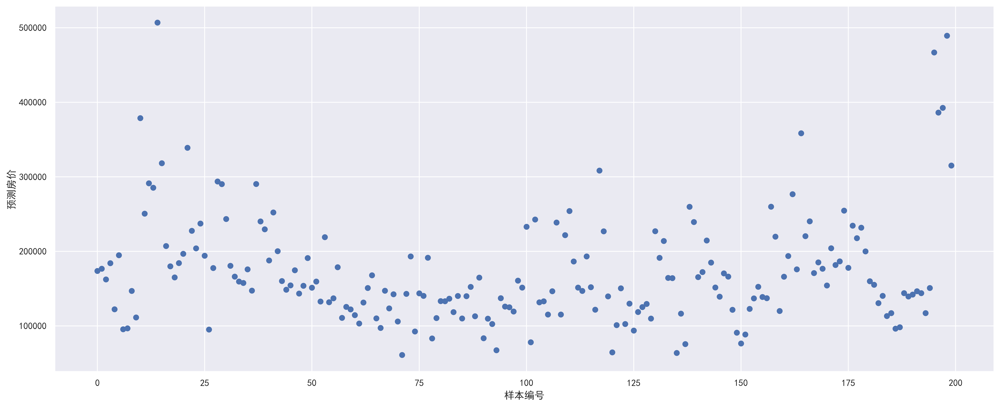

In [67]:
plt.figure(figsize=(20,8),dpi=600)
plt.plot(y_pred_real[0:200],'bo')
plt.xlabel('样本编号')
plt.ylabel('预测房价')
plt.show()